# Phase 1 – Image enhancement, slicing, and edge analysis

This notebook implements the **first phase** of the project pipeline:

1. **Enhancement / smoothing** of the original puzzle images.
2. **Slicing** each enhanced image into a regular grid of tiles (2×2, 4×4, 8×8).
3. **Edge detection** on every tile using three classical methods:
   - Sobel
   - Laplacian
   - Canny
4. (In the final section) **Combining edge maps** and **visualizing** the results.

The goal is to produce clean, reusable intermediate datasets for later phases
(e.g. feature extraction, matching, or re-assembly of puzzle pieces) while
keeping the workflow reproducible and well documented.


In [1]:
from utils.enhancement import enhance_full_image
# from utils.slicing import slice_grid
from utils.visualization import show_before_after

import cv2
import os
import matplotlib.pyplot as plt


## image enhancement (smoothing / pre-processing)

In this step we read the **raw puzzle images** from the `../data/` directory and
apply the project's enhancement pipeline implemented in `utils.enhancement.enhance_full_image`.

The main goals of the enhancement stage are:

- reduce noise and small artifacts,
- improve local contrast,
- and make subsequent edge detection more robust.

The enhanced images are saved under:

- `../phase1/results/enhanced_images/<puzzle_type>/<filename>.png`

This allows later cells (slicing and edge detection) to operate only on
pre-processed images instead of repeating the enhancement each time.



🔹 Processing folder: puzzle_2x2
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\0.jpg


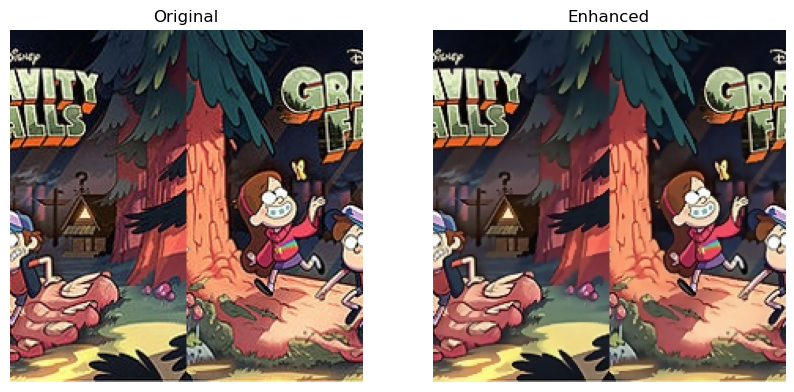

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\1.jpg


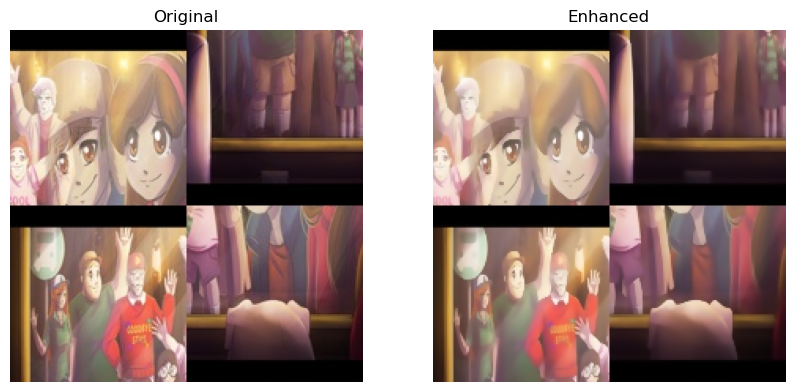

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\10.jpg


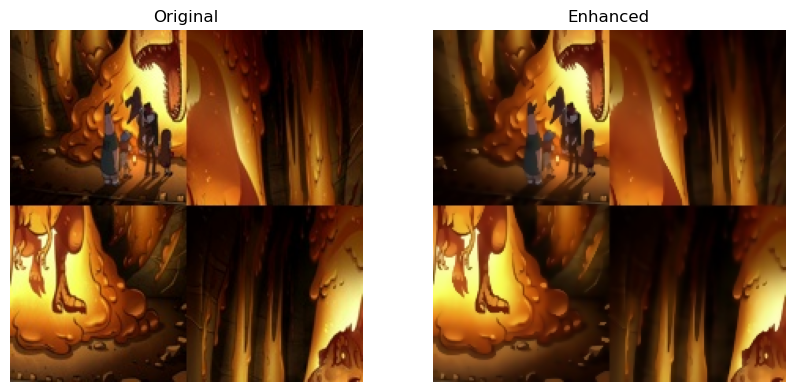

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\100.jpg


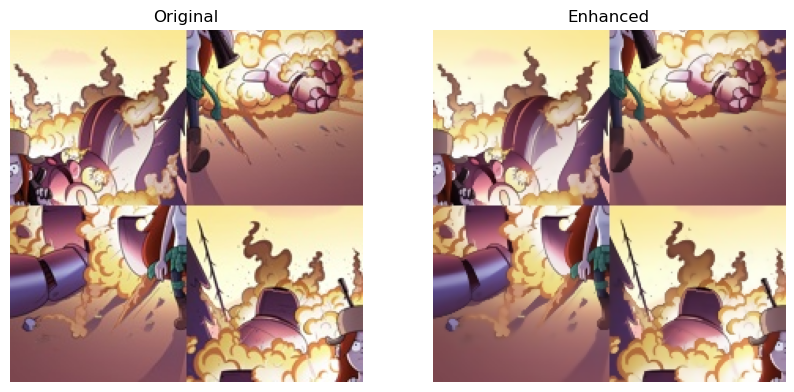

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\101.jpg


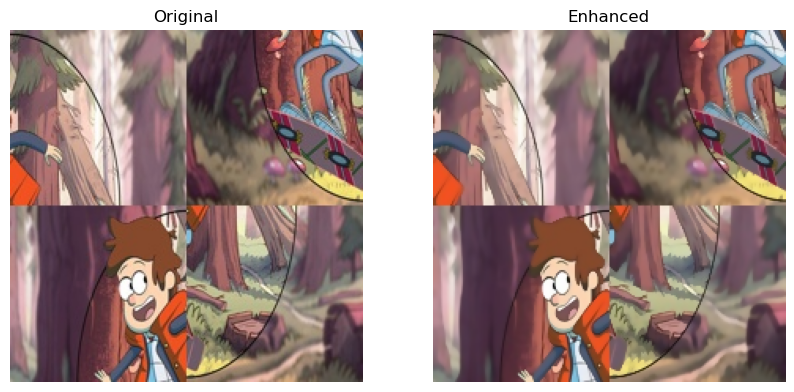

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\102.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\103.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\104.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\105.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\106.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\107.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\108.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\109.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\11.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\12.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\13.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x2\14.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_2x

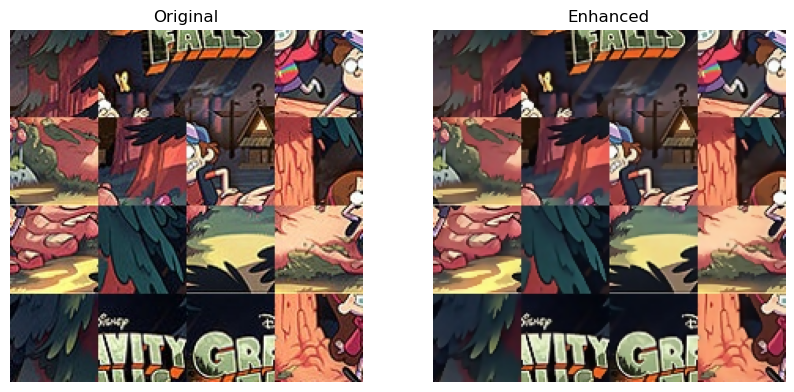

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\1.jpg


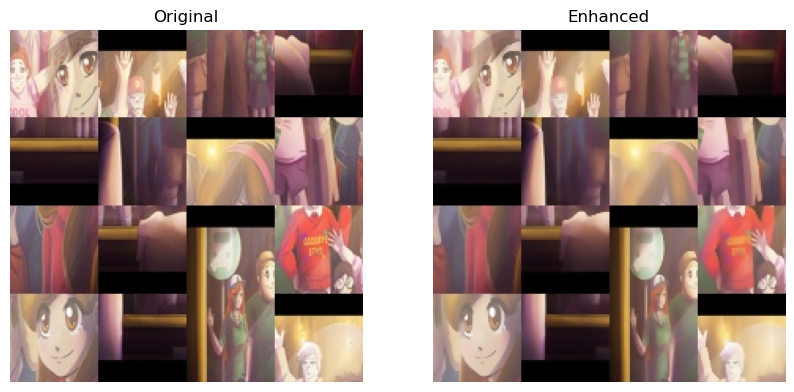

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\10.jpg


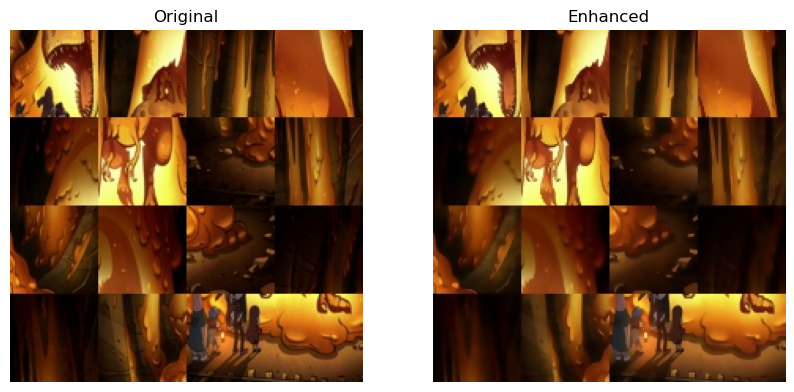

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\100.jpg


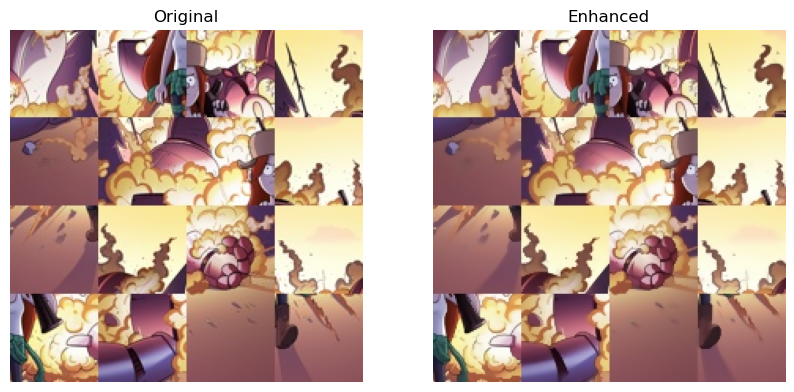

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\101.jpg


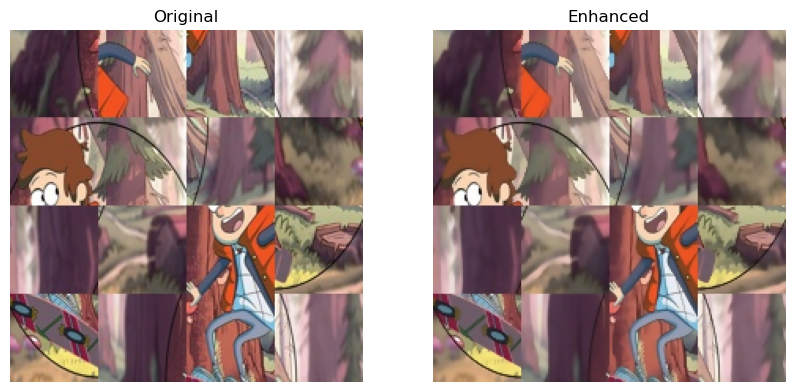

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\102.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\103.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\104.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\105.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\106.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\107.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\108.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\109.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\11.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\12.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\13.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x4\14.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_4x

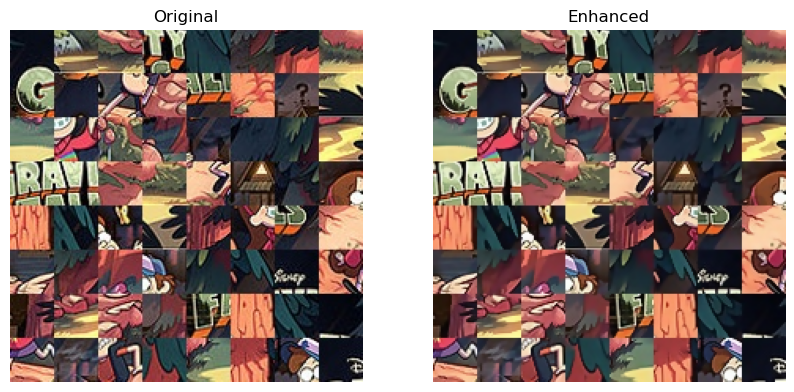

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\1.jpg


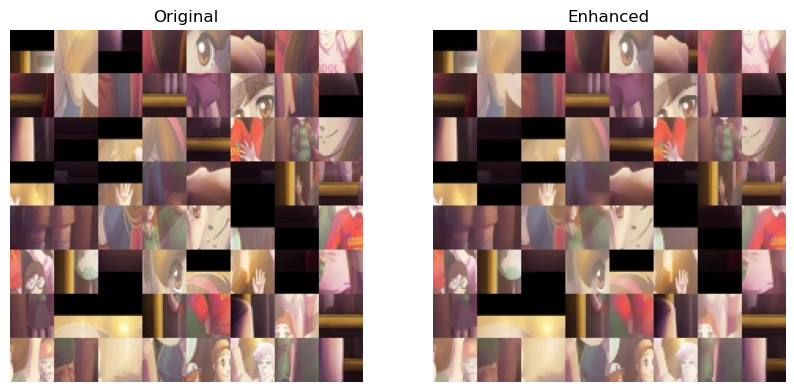

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\10.jpg


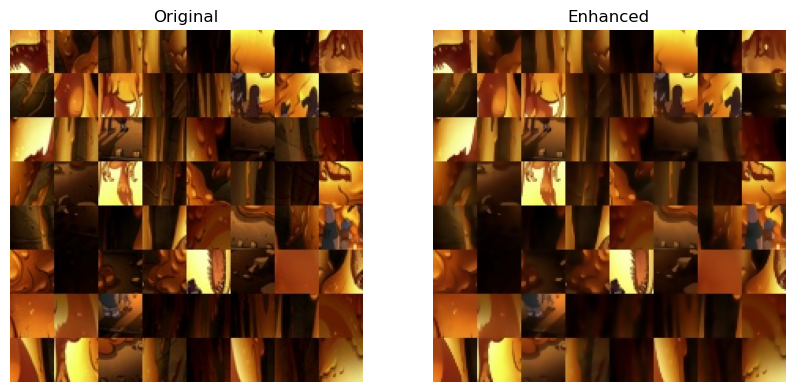

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\100.jpg


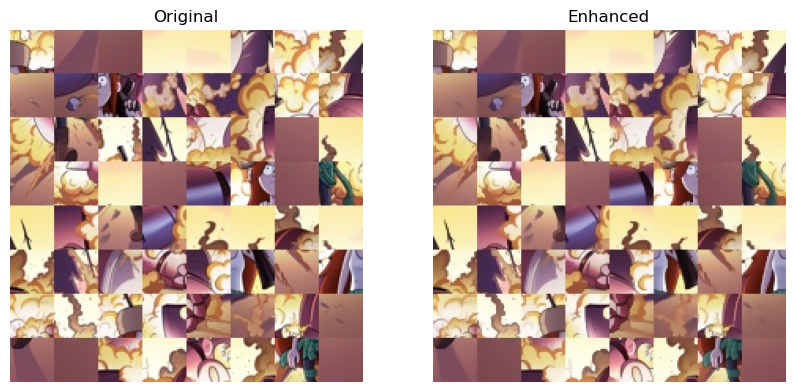

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\101.jpg


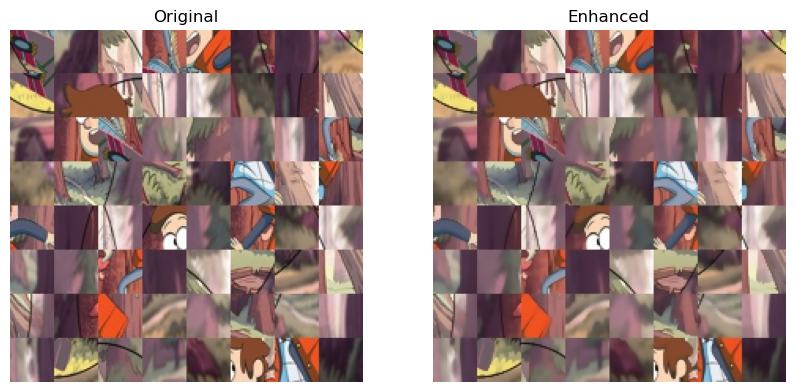

✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\102.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\103.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\104.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\105.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\106.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\107.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\108.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\109.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\11.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\12.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\13.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x8\14.jpg
✔ Saved enhanced image → ../phase1/results/enhanced_images/puzzle_8x

In [2]:
""" 
Enhance all puzzle images using the custom enhancement pipeline.

For each folder in `folders` (e.g. "puzzle_2x2", "puzzle_4x4", "puzzle_8x8"):

1. Read the images from `input_root/<folder>`.
2. Apply `enhance_full_image` (from `utils.enhancement`) to each image.
3. Save the enhanced result into `output_root/<folder>`.

This cell is designed to be run once to generate a clean set of enhanced
images that will be reused by later steps (slicing and edge detection).
"""

import os
import cv2
from utils.enhancement import enhance_full_image   # your pipeline
from utils.visualization import show_before_after   # your comparison function

# ----------------------------
# Paths
# ----------------------------
input_root = "../data/"
output_root = "../phase1/results/enhanced_images/"

folders = {
    "puzzle_2x2": 2,
    "puzzle_4x4": 4,
    "puzzle_8x8": 8
}

# create main output folder
os.makedirs(output_root, exist_ok=True)

# how many previews per folder
samples_per_folder = 5


# ----------------------------
# PROCESS ALL IMAGES
# ----------------------------
for folder_name, grid in folders.items():

    print(f"\n🔹 Processing folder: {folder_name}")

    input_path = os.path.join(input_root, folder_name)
    output_path = os.path.join(output_root, folder_name)

    # create output folder for this puzzle size
    os.makedirs(output_path, exist_ok=True)

    # list all images
    images = [
        f for f in os.listdir(input_path)
        if f.lower().endswith((".png", ".jpg", ".jpeg"))
    ]

    preview_count = 0

    for filename in images:
        img_path = os.path.join(input_path, filename)
        img = cv2.imread(img_path)

        # run enhancement
        enhanced = enhance_full_image(img)["final"]

        # save enhanced image
        save_path = os.path.join(output_path, filename)
        cv2.imwrite(save_path, enhanced)

        print(f"✔ Saved enhanced image → {save_path}")

        # preview first 5 images only
        if preview_count < samples_per_folder:
            show_before_after(
                img,
                enhanced,
                title1="Original",
                title2="Enhanced"
            )
            preview_count += 1


## slicing enhanced images into tiles

Once the images are enhanced, we **divide each image into a regular grid** so
that each tile corresponds to a potential puzzle piece.

For each puzzle type:

- `puzzle_2x2` → grid size 2×2
- `puzzle_4x4` → grid size 4×4
- `puzzle_8x8` → grid size 8×8

The function `slice_grid`:

1. Loads the enhanced image.
2. Computes the tile height/width from the chosen grid size.
3. Iterates over the grid and crops each tile.
4. Saves each tile into a dedicated folder named after the original image.

Tiles are written under:

- `../phase1/results/enhanced_images_sliced/<puzzle_type>/<image_id>/<tile>.png`

This structure is mirrored later when we compute edges on each tile.


In [3]:
"""
Slice all enhanced images into grid tiles.

Inputs:
    input_root  = "./results/enhanced_images"
    folders     = {"puzzle_2x2": 2, "puzzle_4x4": 4, "puzzle_8x8": 8}

For each enhanced image:
    - compute tile width/height from the grid size,
    - crop all tiles,
    - save them under "../phase1/results/enhanced_images_sliced/<puzzle_type>/<image_id>/".

Output:
    A directory containing all tiles for each original image, ready for
    edge detection in the next cell.
"""

import os
import cv2

input_root = "./results/enhanced_images"          # folder that already contains puzzle_2x2, puzzle_4x4, puzzle_8x8
output_root = "../phase1/results/enhanced_images_sliced"  # where to save sliced pieces

folders = {
    "puzzle_2x2": 2,
    "puzzle_4x4": 4,
    "puzzle_8x8": 8
}

os.makedirs(output_root, exist_ok=True)

def slice_grid(image_path, save_dir, grid):
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Cannot read image: {image_path}")
    h, w = img.shape[:2]
    base_h = h // grid
    base_w = w // grid
    index = 0
    for row in range(grid):
        y1 = row * base_h
        y2 = (row + 1) * base_h if row < grid - 1 else h
        for col in range(grid):
            x1 = col * base_w
            x2 = (col + 1) * base_w if col < grid - 1 else w
            piece = img[y1:y2, x1:x2]
            os.makedirs(save_dir, exist_ok=True)
            piece_path = os.path.join(save_dir, f"piece_{index:03d}.png")
            cv2.imwrite(piece_path, piece)
            index += 1
    return index

for folder, grid in folders.items():
    in_path = os.path.join(input_root, folder)
    if not os.path.isdir(in_path):
        print(f"Skipping (not found): {in_path}")
        continue
    out_folder = os.path.join(output_root, folder)
    os.makedirs(out_folder, exist_ok=True)
    images = sorted([f for f in os.listdir(in_path) if f.lower().endswith((".png", ".jpg", ".jpeg"))])
    for filename in images:
        src = os.path.join(in_path, filename)
        name = os.path.splitext(filename)[0]
        dest_dir = os.path.join(out_folder, name)
        try:
            n = slice_grid(src, dest_dir, grid)
            print(f"Sliced {filename} -> {n} pieces saved to {dest_dir}")
        except Exception as e:
            print(f"ERROR slicing {filename}: {e}")

print("Done.")


Sliced 0.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\0
Sliced 1.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\1
Sliced 10.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\10
Sliced 100.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\100
Sliced 101.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\101
Sliced 102.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\102
Sliced 103.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\103
Sliced 104.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\104
Sliced 105.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\105
Sliced 106.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\106
Sliced 107.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\10

## applying edge detection on the sliced images

In this section we take each **enhanced and sliced tile** and compute three
classical edge maps, implemented in `utils.edges`:

- **Sobel** – first-order derivative operator. Highlights horizontal and vertical
  intensity changes and gives strong responses on main object contours.
- **Laplacian** – second-order derivative operator. More sensitive to fine
  detail and noise; often reveals corners and thin structures.
- **Canny** – multi-stage detector (smoothing, gradient, non-maximum suppression,
  and hysteresis thresholding). Produces a thin, binary edge map and generally
  keeps only the most reliable edges.

Input tiles are read from:

- `./results/enhanced_images_sliced/<puzzle_type>/<image_id>/<tile>.png`

and for each tile we save three grayscale edge maps to:

- `./results/edges_detection_results/sobel/...`
- `./results/edges_detection_results/laplacian/...`
- `./results/edges_detection_results/canny/...`

These per-method edge maps form the basis for the combined edge representations
defined in the next section.


In [4]:
"""
Apply Sobel, Laplacian and Canny edge detection to all sliced enhanced tiles.

For every puzzle type (2x2, 4x4, 8x8):

1. Read each tile from `sliced_root`.
2. Compute three edge maps using `utils.edges`:
   - sobel_edges(img)
   - laplacian_edges(img)
   - canny_edges(img, threshold1=80, threshold2=160)
3. Save the results in a mirrored folder structure under `output_root` so that
   each method has its own subfolder.

This cell does not visualize anything; it only prepares clean edge datasets
for subsequent analysis and visualization.
"""

import os
import cv2
import numpy as np

from utils.edges import sobel_edges, laplacian_edges, canny_edges

# -----------------------------
# Paths
# -----------------------------
sliced_root = "./results/enhanced_images_sliced"
output_root = "./results/edges_detection_results"

folders = {
    "puzzle_2x2": 2,
    "puzzle_4x4": 4,
    "puzzle_8x8": 8
}

methods = ["sobel", "laplacian", "canny"]

# -----------------------------
# Create output folder structure
# -----------------------------
for method in methods:
    for puzzle in folders:
        os.makedirs(os.path.join(output_root, method, puzzle), exist_ok=True)


# -----------------------------
# Read ALL SUBFOLDERS + images
# -----------------------------
for puzzle in folders:

    puzzle_path = os.path.join(sliced_root, puzzle)
    print(f"\n🔍 Processing puzzle folder: {puzzle}")

    # Example: puzzle_2x2 → folders 0,1,2,...
    subfolders = sorted([d for d in os.listdir(puzzle_path)
                         if os.path.isdir(os.path.join(puzzle_path, d))])

    if not subfolders:
        print("❌ No subfolders found!")
        continue

    for sub in subfolders:

        sub_in_path = os.path.join(puzzle_path, sub)

        # Create matching output subfolder
        for method in methods:
            os.makedirs(os.path.join(output_root, method, puzzle, sub), exist_ok=True)

        files = sorted([f for f in os.listdir(sub_in_path)
                        if f.lower().endswith((".png", ".jpg", ".jpeg"))])

        print(f"   ➤ Processing subfolder {sub} ({len(files)} pieces)")

        for filename in files:

            img_path = os.path.join(sub_in_path, filename)
            img = cv2.imread(img_path)
            if img is None:
                continue

            # Apply techniques
            sobel_map = sobel_edges(img)
            lap_map = laplacian_edges(img)
            canny_map = canny_edges(img, threshold1=80, threshold2=160)

            # Save in corresponding method folders
            cv2.imwrite(os.path.join(output_root, "sobel", puzzle, sub, filename), sobel_map)
            cv2.imwrite(os.path.join(output_root, "laplacian", puzzle, sub, filename), lap_map)
            cv2.imwrite(os.path.join(output_root, "canny", puzzle, sub, filename), canny_map)

print("\n✅ DONE! All sliced pieces processed.")



🔍 Processing puzzle folder: puzzle_2x2
   ➤ Processing subfolder 0 (4 pieces)
   ➤ Processing subfolder 1 (4 pieces)
   ➤ Processing subfolder 10 (4 pieces)
   ➤ Processing subfolder 100 (4 pieces)
   ➤ Processing subfolder 101 (4 pieces)
   ➤ Processing subfolder 102 (4 pieces)
   ➤ Processing subfolder 103 (4 pieces)
   ➤ Processing subfolder 104 (4 pieces)
   ➤ Processing subfolder 105 (4 pieces)
   ➤ Processing subfolder 106 (4 pieces)
   ➤ Processing subfolder 107 (4 pieces)
   ➤ Processing subfolder 108 (4 pieces)
   ➤ Processing subfolder 109 (4 pieces)
   ➤ Processing subfolder 11 (4 pieces)
   ➤ Processing subfolder 12 (4 pieces)
   ➤ Processing subfolder 13 (4 pieces)
   ➤ Processing subfolder 14 (4 pieces)
   ➤ Processing subfolder 15 (4 pieces)
   ➤ Processing subfolder 16 (4 pieces)
   ➤ Processing subfolder 17 (4 pieces)
   ➤ Processing subfolder 18 (4 pieces)
   ➤ Processing subfolder 19 (4 pieces)
   ➤ Processing subfolder 2 (4 pieces)
   ➤ Processing subfolder 20 (4 p

In [5]:
# (Optional) quick preview helper using process_folders_edges.
# from utils.edges import process_folders_edges

# input_root = "./results/enhanced_images"
# folders = {
#     "puzzle_2x2": 2,
#     "puzzle_4x4": 4,
#     "puzzle_8x8": 8
# }

# # quick preview 5 samples per folder, don't save files yet
# process_folders_edges(
#     input_root=input_root,
#     folders=folders,
#     output_root=None,          # don't save now
#     methods=("sobel","laplacian","canny"),
#     samples_per_folder=5,
#     save_maps=False,
#     canny_params={"threshold1":80,"threshold2":180,"apertureSize":3,"L2gradient":False},
#     sobel_ksize=3,
#     lap_ksize=3
# )



Processing folder: puzzle_2x2
Preview → 0.jpg


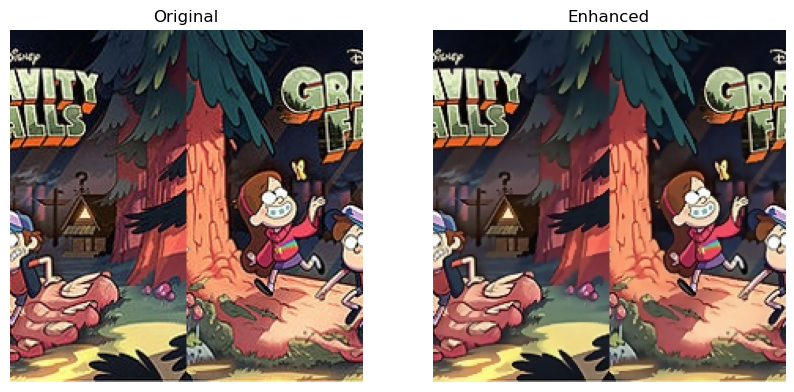

Preview → 1.jpg


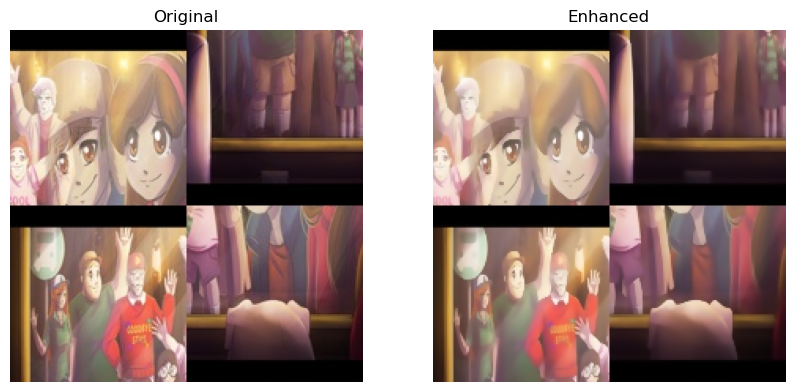

Preview → 10.jpg


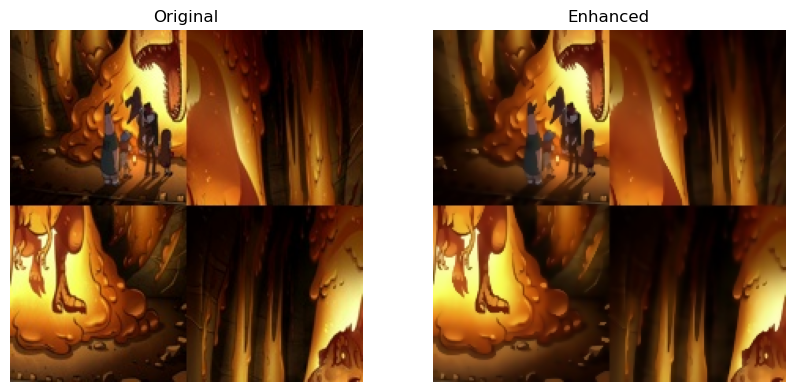

Preview → 100.jpg


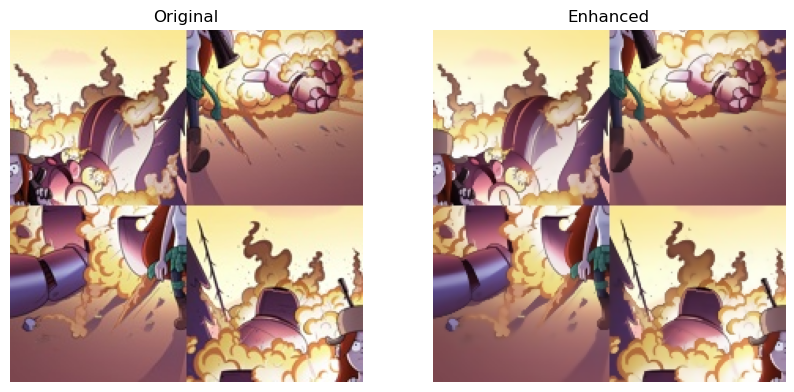

Preview → 101.jpg


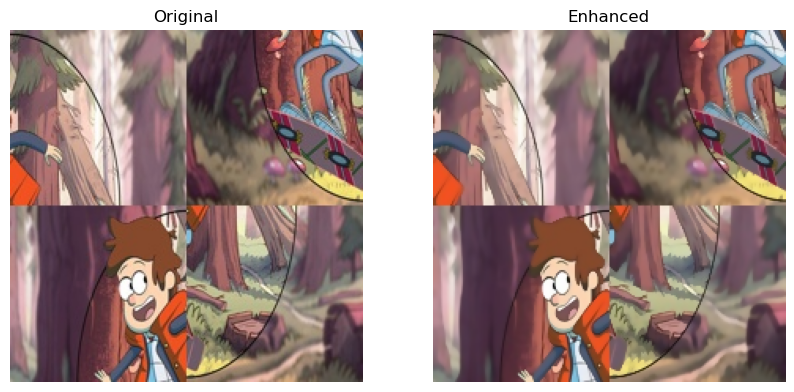


Processing folder: puzzle_4x4
Preview → 0.jpg


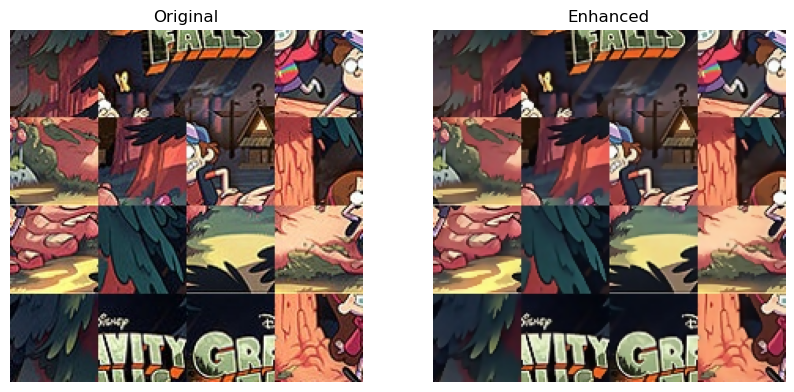

Preview → 1.jpg


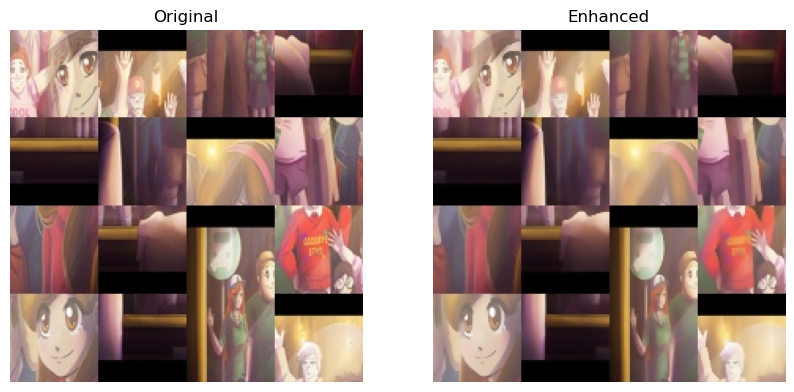

Preview → 10.jpg


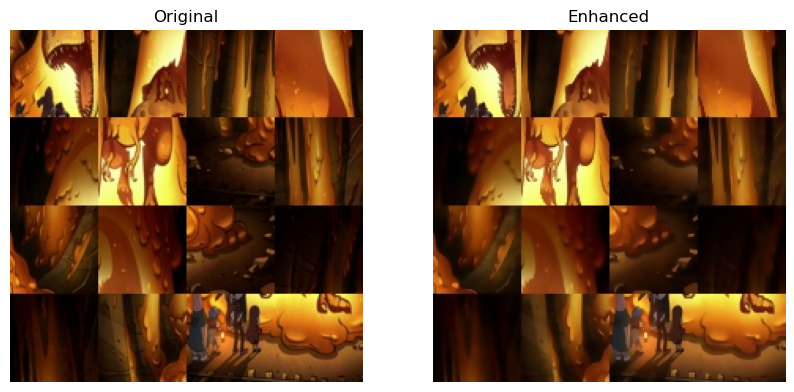

Preview → 100.jpg


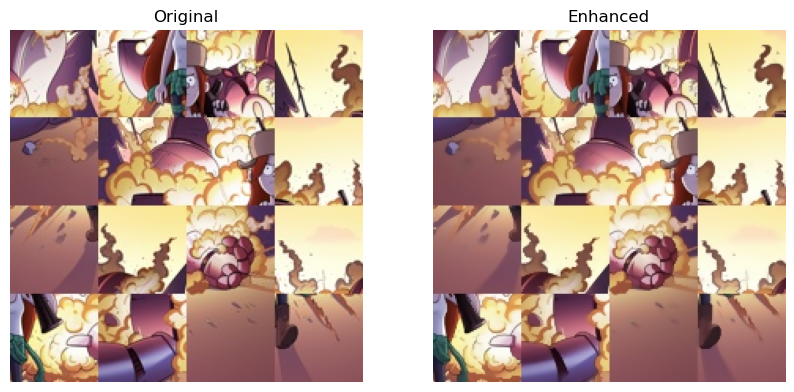

Preview → 101.jpg


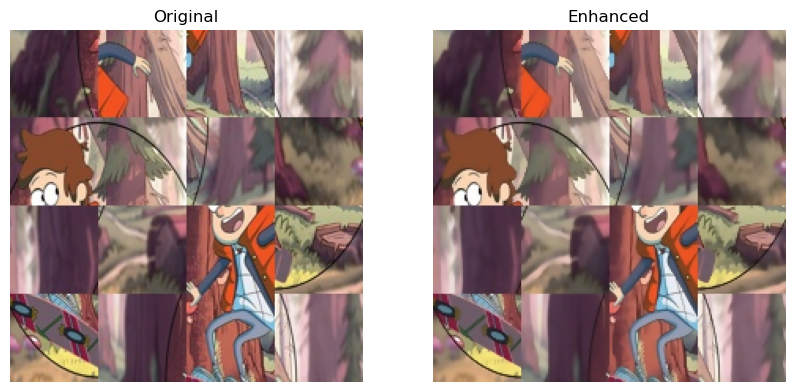


Processing folder: puzzle_8x8
Preview → 0.jpg


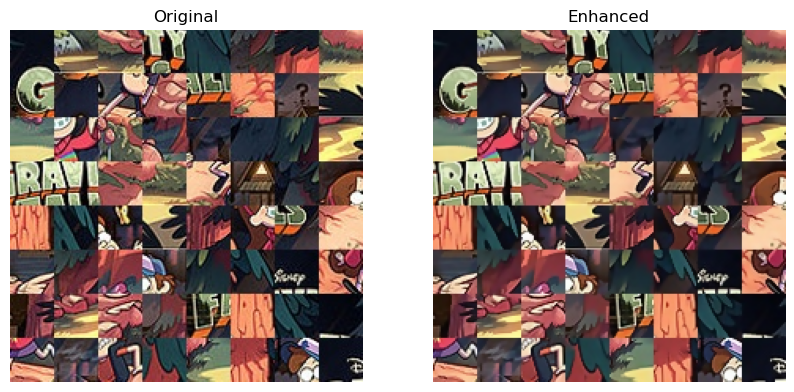

Preview → 1.jpg


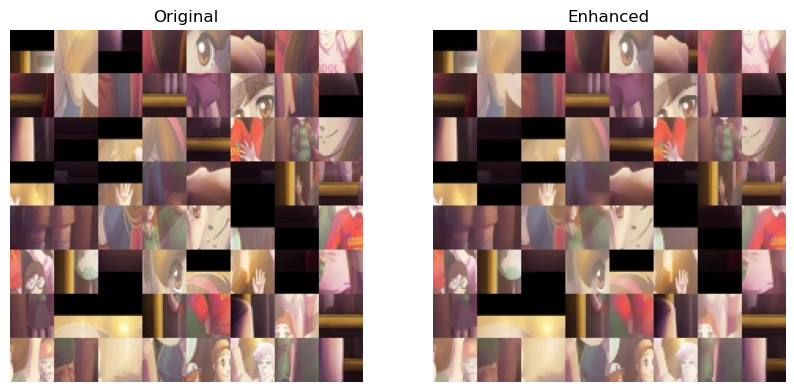

Preview → 10.jpg


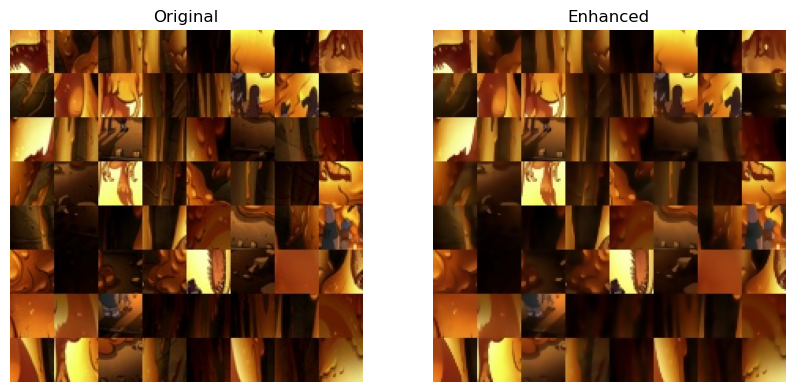

Preview → 100.jpg


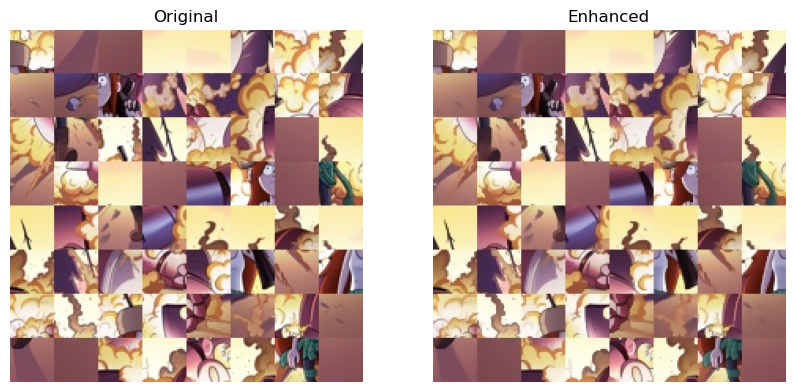

Preview → 101.jpg


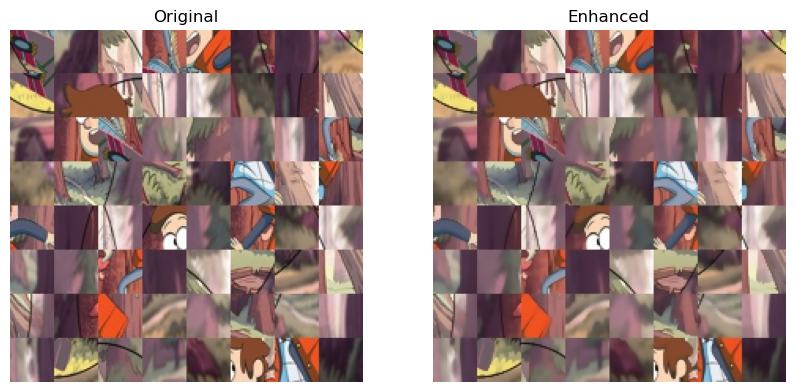

In [6]:
# (Optional) visualization-only code for enhanced images (kept for reference).
 
#     "puzzle_2x2": 2,
#     "puzzle_4x4": 4,
#     "puzzle_8x8": 8
# }

# os.makedirs(enhanced_root, exist_ok=True)

# # Counter for visualization (you want to SHOW only 10, but SAVE ALL)
# visualize_limit = 10
# visualize_count = 0

# for folder, grid in folders.items():
#     print(f"\nProcessing folder: {folder}")

#     in_path = os.path.join(input_root, folder)
#     out_path = os.path.join(enhanced_root, folder)
#     os.makedirs(out_path, exist_ok=True)

#     images = [
#         f for f in os.listdir(in_path)
#         if f.lower().endswith((".png", ".jpg", ".jpeg"))
#     ]

#     for filename in images:
#         img_path = os.path.join(in_path, filename)
#         img = cv2.imread(img_path)

#         # run enhancement pipeline (your updated one)
#         outputs = enhance_full_image(img)
#         enhanced_img = outputs["final"]

#         # save enhanced full image
#         save_path = os.path.join(out_path, filename)
#         cv2.imwrite(save_path, enhanced_img)
#         print(f"Enhanced → {save_path}")

#         # only show first 10 examples (NOT save only 10)
#         if visualize_count < visualize_limit:
#             show_before_after(img, enhanced_img,
#                               title1="Original",
#                               title2="Enhanced")
#             visualize_count += 1



input_root = "../data/"

folders = {
    "puzzle_2x2": 2,
    "puzzle_4x4": 4,
    "puzzle_8x8": 8
}

# Show 5 samples PER FOLDER
samples_per_folder = 5

for folder, grid in folders.items():
    print(f"\nProcessing folder: {folder}")

    in_path = os.path.join(input_root, folder)

    # get all images
    images = [
        f for f in os.listdir(in_path)
        if f.lower().endswith((".png", ".jpg", ".jpeg"))
    ]

    preview_count = 0  # reset counter **for each folder**

    for filename in images:
        img_path = os.path.join(in_path, filename)
        img = cv2.imread(img_path)

        # run your enhancement pipeline
        outputs = enhance_full_image(img)
        enhanced_img = outputs["final"]

        print(f"Preview → {filename}")

        # show only first 5 enhanced samples **from this folder**
        if preview_count < samples_per_folder:
            show_before_after(
                img,
                enhanced_img,
                title1="Original",
                title2="Enhanced"
            )
            preview_count += 1

        # stop previewing this folder
        if preview_count >= samples_per_folder:
            break





In [7]:
# (Optional) alternative slicing implementation kept as a reference.
# sliced_root = "../phase1/results/"

# for folder, grid in folders.items():
#     print(f"Slicing enhanced images: {folder}")

#     in_path = os.path.join(enhanced_root, folder)
#     out_path = os.path.join(sliced_root, folder)
#     os.makedirs(out_path, exist_ok=True)

#     for filename in os.listdir(in_path):
#         if not filename.lower().endswith((".png", ".jpg")):
#             continue

#         img_path = os.path.join(in_path, filename)
#         img = cv2.imread(img_path)

#         img_save_dir = os.path.join(out_path, filename.split(".")[0])
#         os.makedirs(img_save_dir, exist_ok=True)

#         num_saved = slice_grid(img, img_save_dir, grid)
#         print(f"Sliced {filename} → {num_saved} pieces")


In [8]:



# root_data = "../data/"                # where puzzle_2x2, puzzle_4x4, puzzle_8x8 live
# output_root = "../phase1/results/"   # where sliced pieces will be saved


# puzzle_folders = {
#     "puzzle_2x2": 2,
#     "puzzle_4x4": 4,
#     "puzzle_8x8": 8
# }

# # Ensure output root exists
# os.makedirs(output_root, exist_ok=True)


 
# #   slice any image into grid_size x grid_size pieces
 
# def slice_grid(image_path, save_dir, grid_size):

#     img = cv2.imread(image_path)
#     if img is None:
#         raise ValueError(f"Failed to read image: {image_path}")

#     h, w = img.shape[:2]


#     # Compute base piece size (floor division). We'll handle remainder on the last row/column.
#     base_piece_h = h // grid_size
#     base_piece_w = w // grid_size

#     os.makedirs(save_dir, exist_ok=True)

#     index = 0                                                
#     for row in range(grid_size):
#         # y start
#         y1 = row * base_piece_h
#         # y end: for last row, use full image height to include any remainder
#         y2 = (row + 1) * base_piece_h if row < grid_size - 1 else h

#         for col in range(grid_size):
#             x1 = col * base_piece_w
#             x2 = (col + 1) * base_piece_w if col < grid_size - 1 else w

#             # crop the tile
#             piece = img[y1:y2, x1:x2]

#             # save tile with zero-padded index
#             piece_filename = f"piece_{index:03d}.png"
#             piece_path = os.path.join(save_dir, piece_filename)
#             cv2.imwrite(piece_path, piece)

#             index += 1

#     return index



# # Main processing loop: go over each configured puzzle folder

# for folder_name, grid in puzzle_folders.items():
#     input_folder = os.path.join(root_data, folder_name)
#     output_folder = os.path.join(output_root, folder_name)

#     # skip if the input folder doesn't exist
#     if not os.path.exists(input_folder):
#         print(f"Skipping '{folder_name}': input folder not found at {input_folder}")
#         continue

#     # ensure output folder exists
#     os.makedirs(output_folder, exist_ok=True)

#     print(f"\nProcessing folder: {folder_name}  (Grid: {grid}x{grid})")

#     # iterate all image files in the input folder
#     for filename in sorted(os.listdir(input_folder)):
#         if not filename.lower().endswith((".png", ".jpg", ".jpeg")):
#             continue

#         img_path = os.path.join(input_folder, filename)
#         # folder to save pieces for this image, named by the base image file (without extension)
#         img_name = os.path.splitext(filename)[0]
#         img_output_dir = os.path.join(output_folder, img_name)
#         os.makedirs(img_output_dir, exist_ok=True)

#         print(f"  - Slicing '{filename}' ...", end=" ")
#         try:
#             num_saved = slice_grid(img_path, img_output_dir, grid)
#             print(f"done ({num_saved} pieces saved).")
#         except Exception as e:
#             print(f"ERROR: {e}")

# print("\nAll done — check the output folders under:", output_root)


## combining edge detection methods

To obtain richer and more stable edge representations, we now combine the
individual edge maps (Sobel, Laplacian, Canny) computed for each tile.

Each method has different strengths:

- **Sobel** – strong on main contours, robust to small noise.
- **Laplacian** – sensitive to fine details and corners.
- **Canny** – produces thin edges and discards many weak responses.

By fusing them we aim to keep edges that are **strong, consistent and well
localized**. For every tile we create three combined edge maps:

1. **sobel_laplacian_sum**  
   Weighted fusion of Sobel and Laplacian using `cv2.addWeighted`. This gives
   a smooth compromise between the two responses.

2. **sobel_laplacian_product**  
   Element-wise product of Sobel and Laplacian (with normalization). High
   values occur only where *both* methods agree, emphasizing confident edges.

3. **canny_sobel_mask**  
   Canny is a thin, binary edge map. We compute an Otsu threshold on the Sobel
   magnitude and keep only the Canny pixels that are also strong according to
   Sobel. This yields edges that are both geometrically thin and strong in
   gradient.

The outputs are stored under:

- `./results/edges_detection_combinations/sobel_laplacian_sum/...`
- `./results/edges_detection_combinations/sobel_laplacian_product/...`
- `./results/edges_detection_combinations/canny_sobel_mask/...`

with the same folder hierarchy and filenames as the original edge maps.


In [9]:
import os
import cv2
import numpy as np

def build_edge_combinations(sobel_map: np.ndarray,
                            laplacian_map: np.ndarray,
                            canny_map: np.ndarray) -> dict:
    """Build different combined edge maps from Sobel, Laplacian and Canny outputs.

    Parameters
    ----------
    sobel_map : np.ndarray
        Grayscale edge magnitude from Sobel.
    laplacian_map : np.ndarray
        Grayscale Laplacian response.
    canny_map : np.ndarray
        Binary or strong edges from Canny.

    Returns
    -------
    dict
        Dictionary of combined edge maps:
        - 'sobel_laplacian_sum'
        - 'sobel_laplacian_product'
        - 'canny_sobel_mask'
    """

    # Ensure everything is in float32 for intermediate math
    sobel_f = sobel_map.astype(np.float32)
    lap_f   = laplacian_map.astype(np.float32)
    canny_f = canny_map.astype(np.float32)

    # 1) Smooth fusion: weighted sum of Sobel + Laplacian
    sobel_lap_sum = cv2.addWeighted(sobel_map, 0.5, laplacian_map, 0.5, 0.0)

    # 2) Element-wise product: only high response where both are strong
    product = sobel_f * lap_f
    product_norm = cv2.normalize(product, None, 0, 255, cv2.NORM_MINMAX)
    sobel_lap_product = product_norm.astype(np.uint8)

    # 3) Canny edges masked with Sobel magnitude
    #    (keep Canny edges only where Sobel is also strong)
    _, sobel_bin = cv2.threshold(sobel_map, 0, 255, cv2.THRESH_OTSU)
    canny_sobel_mask = cv2.bitwise_and(canny_map, sobel_bin)

    return {
        "sobel_laplacian_sum": sobel_lap_sum,
        "sobel_laplacian_product": sobel_lap_product,
        "canny_sobel_mask": canny_sobel_mask,
    }


In [10]:
import os
import cv2
import numpy as np

# ---------------------------------------------------------------------
# Helper: build 10 different edge combinations for a single tile
# ---------------------------------------------------------------------
def build_edge_combinations(sobel_map: np.ndarray,
                            laplacian_map: np.ndarray,
                            canny_map: np.ndarray) -> dict:
    """
    Build a set of combined edge maps from Sobel, Laplacian and Canny outputs.

    Parameters
    ----------
    sobel_map : np.ndarray
        Grayscale edge magnitude from Sobel.
    laplacian_map : np.ndarray
        Grayscale Laplacian response.
    canny_map : np.ndarray
        Binary or grayscale edges from Canny.

    Returns
    -------
    dict
        Dictionary of combined edge maps (uint8, 0–255):

        1. 'sobel_laplacian_sum'
        2. 'sobel_canny_sum'
        3. 'laplacian_canny_sum'
        4. 'all_methods_sum'
        5. 'sobel_canny_max'
        6. 'all_methods_mean'
        7. 'canny_sobel_mask'
        8. 'laplacian_sharpened_sobel'
        9. 'consistency_vote'
        10. 'gradient_confidence'
    """

    # --- helpers ------------------------------------------------------
    def to_float(img):
        return img.astype(np.float32)

    def norm01(img_f):
        """Normalize float image to [0, 1]."""
        min_val = float(img_f.min())
        max_val = float(img_f.max())
        if max_val - min_val < 1e-5:
            return np.zeros_like(img_f, dtype=np.float32)
        return (img_f - min_val) / (max_val - min_val)

    def to_uint8(img01):
        img01 = np.clip(img01, 0.0, 1.0)
        return (img01 * 255.0).astype(np.uint8)

    sobel_f = to_float(sobel_map)
    lap_f   = to_float(laplacian_map)
    canny_f = to_float(canny_map)

    sobel_n = norm01(sobel_f)
    lap_n   = norm01(lap_f)
    canny_n = norm01(canny_f)

    # ------------------------------------------------------------------
    # 1) sobel_laplacian_sum  (smooth, balanced)
    # ------------------------------------------------------------------
    sobel_laplacian_sum = to_uint8(0.5 * sobel_n + 0.5 * lap_n)

    # ------------------------------------------------------------------
    # 2) sobel_canny_sum  (smooth Sobel with thin Canny edges on top)
    # ------------------------------------------------------------------
    sobel_canny_sum = to_uint8(0.7 * sobel_n + 0.3 * canny_n)

    # ------------------------------------------------------------------
    # 3) laplacian_canny_sum  (fine details + Canny)
    # ------------------------------------------------------------------
    laplacian_canny_sum = to_uint8(0.5 * lap_n + 0.5 * canny_n)

    # ------------------------------------------------------------------
    # 4) all_methods_sum  (bright if any detector fires)
    # ------------------------------------------------------------------
    all_methods_sum = to_uint8(np.clip(sobel_n + lap_n + canny_n, 0.0, 1.0))

    # ------------------------------------------------------------------
    # 5) sobel_canny_max  (union of strong edges from Sobel & Canny)
    # ------------------------------------------------------------------
    sobel_canny_max = to_uint8(np.maximum(sobel_n, canny_n))

    # ------------------------------------------------------------------
    # 6) all_methods_mean  (consensus, noise reduction)
    # ------------------------------------------------------------------
    all_methods_mean = to_uint8((sobel_n + lap_n + canny_n) / 3.0)

    # ------------------------------------------------------------------
    # 7) canny_sobel_mask  (Canny edges that are also strong in Sobel)
    # ------------------------------------------------------------------
    _, sobel_bin = cv2.threshold(
        sobel_map, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )
    canny_sobel_mask = cv2.bitwise_and(canny_map, sobel_bin)

    # ------------------------------------------------------------------
    # 8) laplacian_sharpened_sobel  (sharper Sobel edges using Laplacian)
    # ------------------------------------------------------------------
    laplacian_sharpened_sobel = to_uint8(np.clip(sobel_n + 0.4 * lap_n, 0.0, 1.0))

    # ------------------------------------------------------------------
    # 9) consistency_vote  (0–3 "votes" of agreement between methods)
    # ------------------------------------------------------------------
    _, sobel_bin_vote = cv2.threshold(
        sobel_map, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )
    _, lap_bin_vote = cv2.threshold(
        laplacian_map, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )

    sobel_vote = (sobel_bin_vote > 0).astype(np.float32)
    lap_vote   = (lap_bin_vote   > 0).astype(np.float32)
    canny_vote = (canny_map      > 0).astype(np.float32)

    votes = sobel_vote + lap_vote + canny_vote   # 0,1,2,3
    consistency_vote = to_uint8(votes / 3.0)     # scale to 0–1 then 0–255

    # ------------------------------------------------------------------
    # 10) gradient_confidence  (combined gradient strength)
    # ------------------------------------------------------------------
    grad_conf = np.sqrt(sobel_n**2 + lap_n**2) / np.sqrt(2.0)
    gradient_confidence = to_uint8(grad_conf)

    return {
        "sobel_laplacian_sum": sobel_laplacian_sum,
        "sobel_canny_sum": sobel_canny_sum,
        "laplacian_canny_sum": laplacian_canny_sum,
        "all_methods_sum": all_methods_sum,
        "sobel_canny_max": sobel_canny_max,
        "all_methods_mean": all_methods_mean,
        "canny_sobel_mask": canny_sobel_mask,
        "laplacian_sharpened_sobel": laplacian_sharpened_sobel,
        "consistency_vote": consistency_vote,
        "gradient_confidence": gradient_confidence,
    }


# ---------------------------------------------------------------------
# Main loop: build + save combinations for all tiles
# ---------------------------------------------------------------------

edges_root = "./results/edges_detection_results"
combos_root = "./results/edges_detection_combinations"

folders = {
    "puzzle_2x2": 2,
    "puzzle_4x4": 4,
    "puzzle_8x8": 8,
}

combo_names = [
    "sobel_laplacian_sum",
    "sobel_canny_sum",
    "laplacian_canny_sum",
    "all_methods_sum",
    "sobel_canny_max",
    "all_methods_mean",
    "canny_sobel_mask",
    "laplacian_sharpened_sobel",
    "consistency_vote",
    "gradient_confidence",
]

# create top-level combo folders
for name in combo_names:
    os.makedirs(os.path.join(combos_root, name), exist_ok=True)

for puzzle in folders.keys():
    print(f"\n▶ processing combined edges for: {puzzle}")

    sobel_puzzle_root = os.path.join(edges_root, "sobel",     puzzle)
    lap_puzzle_root   = os.path.join(edges_root, "laplacian", puzzle)
    canny_puzzle_root = os.path.join(edges_root, "canny",     puzzle)

    if not os.path.isdir(sobel_puzzle_root):
        print(f"  ⚠ skipping {puzzle}: sobel folder not found at {sobel_puzzle_root}")
        continue
    if not os.path.isdir(lap_puzzle_root):
        print(f"  ⚠ skipping {puzzle}: laplacian folder not found at {lap_puzzle_root}")
        continue
    if not os.path.isdir(canny_puzzle_root):
        print(f"  ⚠ skipping {puzzle}: canny folder not found at {canny_puzzle_root}")
        continue

    for sub in sorted(os.listdir(sobel_puzzle_root)):
        sobel_sub_root = os.path.join(sobel_puzzle_root, sub)
        lap_sub_root   = os.path.join(lap_puzzle_root,   sub)
        canny_sub_root = os.path.join(canny_puzzle_root, sub)

        if not os.path.isdir(sobel_sub_root):
            continue

        # create subfolders for each combination
        out_paths = {}
        for name in combo_names:
            out_sub = os.path.join(combos_root, name, puzzle, sub)
            os.makedirs(out_sub, exist_ok=True)
            out_paths[name] = out_sub

        print(f"  - subfolder: {sub}")

        for filename in sorted(os.listdir(sobel_sub_root)):
            sobel_path = os.path.join(sobel_sub_root, filename)
            lap_path   = os.path.join(lap_sub_root,   filename)
            canny_path = os.path.join(canny_sub_root, filename)

            if not (os.path.isfile(sobel_path) and
                    os.path.isfile(lap_path) and
                    os.path.isfile(canny_path)):
                continue

            sobel_map = cv2.imread(sobel_path, cv2.IMREAD_GRAYSCALE)
            lap_map   = cv2.imread(lap_path,   cv2.IMREAD_GRAYSCALE)
            canny_map = cv2.imread(canny_path, cv2.IMREAD_GRAYSCALE)

            if sobel_map is None or lap_map is None or canny_map is None:
                continue

            # build all combinations
            combos = build_edge_combinations(sobel_map, lap_map, canny_map)

            # save each combination with the same filename
            for name in combo_names:
                combo_img = combos[name]
                cv2.imwrite(os.path.join(out_paths[name], filename), combo_img)

print("\n✅ DONE! All combined edge maps have been generated and saved.")



▶ processing combined edges for: puzzle_2x2
  - subfolder: 0
  - subfolder: 1
  - subfolder: 10
  - subfolder: 100
  - subfolder: 101
  - subfolder: 102
  - subfolder: 103
  - subfolder: 104
  - subfolder: 105
  - subfolder: 106
  - subfolder: 107
  - subfolder: 108
  - subfolder: 109
  - subfolder: 11
  - subfolder: 12
  - subfolder: 13
  - subfolder: 14
  - subfolder: 15
  - subfolder: 16
  - subfolder: 17
  - subfolder: 18
  - subfolder: 19
  - subfolder: 2
  - subfolder: 20
  - subfolder: 21
  - subfolder: 22
  - subfolder: 23
  - subfolder: 24
  - subfolder: 25
  - subfolder: 26
  - subfolder: 27
  - subfolder: 28
  - subfolder: 29
  - subfolder: 3
  - subfolder: 30
  - subfolder: 31
  - subfolder: 32
  - subfolder: 33
  - subfolder: 34
  - subfolder: 35
  - subfolder: 36
  - subfolder: 37
  - subfolder: 38
  - subfolder: 39
  - subfolder: 4
  - subfolder: 40
  - subfolder: 41
  - subfolder: 42
  - subfolder: 43
  - subfolder: 44
  - subfolder: 45
  - subfolder: 46
  - subfolder:

## visualization of edge detection and combinations

To qualitatively compare the behaviour of each edge detector and the three
combinations, we visualize a **single example tile**:

- original enhanced tile,
- Sobel edge map,
- Laplacian edge map,
- Canny edge map,
- combined maps: **sobel_laplacian_sum**, **sobel_laplacian_product**, **canny_sobel_mask**.

> **Tip:** Update the puzzle name, subfolder and filename in the code cell
> below to explore different tiles without changing the rest of the logic.


[i] Auto-selected example tile:
    puzzle: puzzle_2x2
    sub   : 0
    file  : piece_000.png


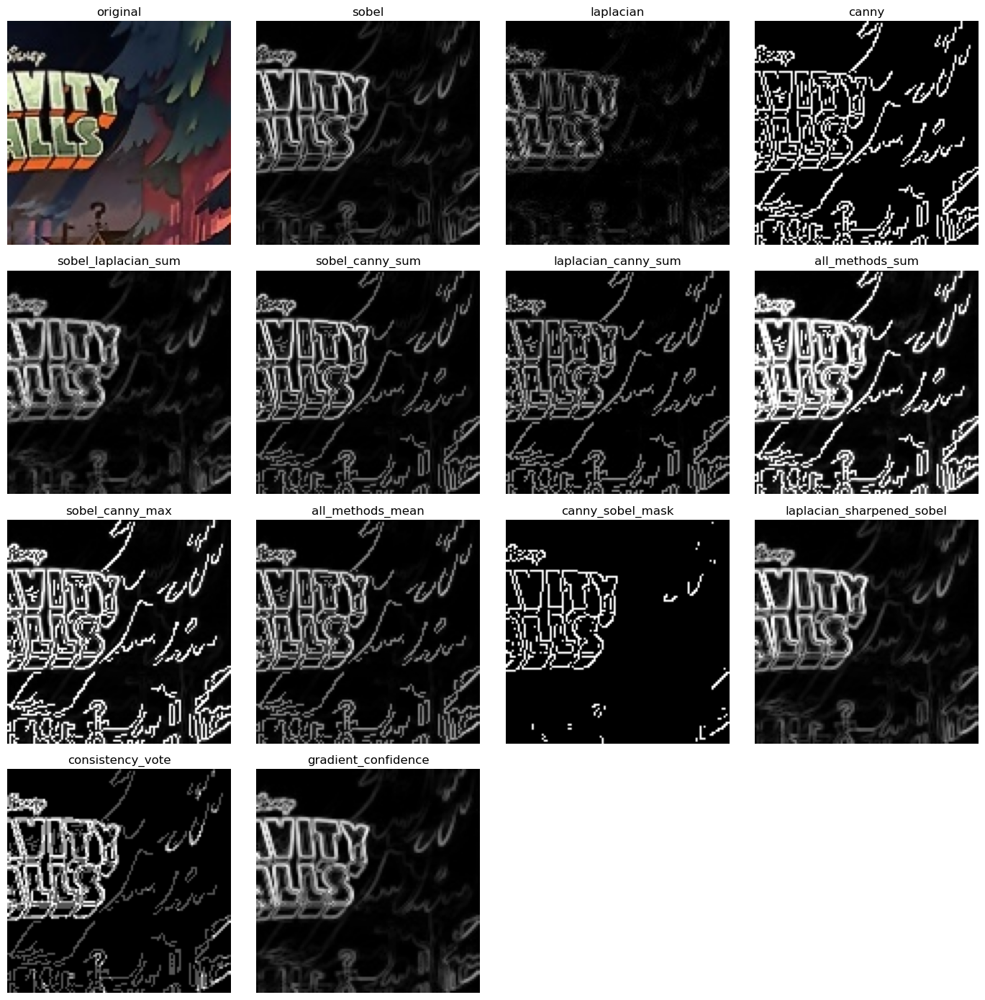

In [12]:
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------
# Automatic visualization of:
#   - original enhanced tile
#   - Sobel / Laplacian / Canny edge maps
#   - ALL 10 combined edge maps (if they exist on disk)
# ---------------------------------------------------------------------

import os
import cv2

# Set these to None to let the script auto-detect a valid example tile.
# To override, set them to explicit values like:
#   example_puzzle = "puzzle_2x2"
#   example_sub    = "0"
#   example_file   = "piece_000.png"
example_puzzle = None
example_sub    = None
example_file   = None

orig_root   = "./results/enhanced_images_sliced"
edges_root  = "./results/edges_detection_results"
combos_root = "./results/edges_detection_combinations"


def find_first_valid_tile(orig_root, edges_root):
    """Search for the first tile that has original + Sobel + Laplacian + Canny."""
    if not os.path.isdir(orig_root):
        print(f"[!] Original tiles root not found: {orig_root}")
        return None, None, None

    for puzzle in sorted(os.listdir(orig_root)):
        puzzle_path = os.path.join(orig_root, puzzle)
        if not os.path.isdir(puzzle_path):
            continue

        for sub in sorted(os.listdir(puzzle_path)):
            sub_path = os.path.join(puzzle_path, sub)
            if not os.path.isdir(sub_path):
                continue

            for filename in sorted(os.listdir(sub_path)):
                if not filename.lower().endswith((".png", ".jpg", ".jpeg")):
                    continue

                orig_path  = os.path.join(orig_root, puzzle, sub, filename)
                sobel_path = os.path.join(edges_root, "sobel",     puzzle, sub, filename)
                lap_path   = os.path.join(edges_root, "laplacian", puzzle, sub, filename)
                canny_path = os.path.join(edges_root, "canny",     puzzle, sub, filename)

                needed = [orig_path, sobel_path, lap_path, canny_path]
                if all(os.path.isfile(p) for p in needed):
                    print("[i] Auto-selected example tile:")
                    print("    puzzle:", puzzle)
                    print("    sub   :", sub)
                    print("    file  :", filename)
                    return puzzle, sub, filename

    print("[!] No tile with original + Sobel + Laplacian + Canny was found.")
    return None, None, None


# Auto-detect if any of the three identifiers is None
if example_puzzle is None or example_sub is None or example_file is None:
    example_puzzle, example_sub, example_file = find_first_valid_tile(
        orig_root, edges_root
    )

if example_puzzle is None:
    raise RuntimeError(
        "Could not find any tile that has original + Sobel + Laplacian + Canny.\n"
        "Please check that enhancement, slicing, and edge detection cells have run successfully."
    )

# ---------------------------------------------------------------------
# Paths for the selected tile
# ---------------------------------------------------------------------

orig_path   = os.path.join(orig_root, example_puzzle, example_sub, example_file)
sobel_path  = os.path.join(edges_root, "sobel",     example_puzzle, example_sub, example_file)
lap_path    = os.path.join(edges_root, "laplacian", example_puzzle, example_sub, example_file)
canny_path  = os.path.join(edges_root, "canny",     example_puzzle, example_sub, example_file)

# Load base images
orig_bgr = cv2.imread(orig_path)
sobel    = cv2.imread(sobel_path, cv2.IMREAD_GRAYSCALE)
lap      = cv2.imread(lap_path,   cv2.IMREAD_GRAYSCALE)
canny    = cv2.imread(canny_path, cv2.IMREAD_GRAYSCALE)

if orig_bgr is None:
    raise RuntimeError(f"Failed to read original tile image at: {orig_path}")

orig = cv2.cvtColor(orig_bgr, cv2.COLOR_BGR2RGB)

# ---------------------------------------------------------------------
# Load all 10 combinations (if present)
# ---------------------------------------------------------------------

combo_candidates = [
    ("sobel_laplacian_sum",      "sobel_laplacian_sum"),
    ("sobel_canny_sum",          "sobel_canny_sum"),
    ("laplacian_canny_sum",      "laplacian_canny_sum"),
    ("all_methods_sum",          "all_methods_sum"),
    ("sobel_canny_max",          "sobel_canny_max"),
    ("all_methods_mean",         "all_methods_mean"),
    ("canny_sobel_mask",         "canny_sobel_mask"),
    ("laplacian_sharpened_sobel","laplacian_sharpened_sobel"),
    ("consistency_vote",         "consistency_vote"),
    ("gradient_confidence",      "gradient_confidence"),
]

combo_images = []

for label, folder in combo_candidates:
    combo_path = os.path.join(combos_root, folder, example_puzzle, example_sub, example_file)
    if os.path.isfile(combo_path):
        img = cv2.imread(combo_path, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            combo_images.append((label, img))

if not combo_images:
    print("[!] No combination images found for this tile. "
          "Did you run the combination-generation cell?")

# ---------------------------------------------------------------------
# Plot in a 4x4 grid:
#   Row 1: original, sobel, laplacian, canny
#   Rows 2–4: up to 10 combo maps, in the order above
# ---------------------------------------------------------------------

plt.figure(figsize=(14, 14))

# Top row: original + three base edge maps
plt.subplot(4, 4, 1); plt.imshow(orig);    plt.title("original");   plt.axis("off")
plt.subplot(4, 4, 2); plt.imshow(sobel, cmap="gray"); plt.title("sobel");       plt.axis("off")
plt.subplot(4, 4, 3); plt.imshow(lap,   cmap="gray"); plt.title("laplacian");   plt.axis("off")
plt.subplot(4, 4, 4); plt.imshow(canny, cmap="gray"); plt.title("canny");       plt.axis("off")

# Next slots: combos (up to 12 slots remaining)
for idx, (label, img) in enumerate(combo_images, start=1):
    if idx > 12:  # 16 total slots - 4 used by originals = 12
        break
    plt.subplot(4, 4, 4 + idx)
    plt.imshow(img, cmap="gray")
    plt.title(label)
    plt.axis("off")

plt.tight_layout()
plt.show()


## summary

This notebook completes Phase 1 of the pipeline:

1. Enhanced all puzzle images and stored them in a reusable format.
2. Sliced enhanced images into tiles according to the puzzle grid size.
3. Computed Sobel, Laplacian and Canny edge maps for each tile.
4. Built three combined edge representations per tile.
5. Visualized individual and combined edge maps for qualitative inspection.

The resulting images (enhanced tiles, edges, and combined edges) can now be
used as inputs for subsequent phases, such as feature extraction, matching,
and puzzle re-assembly.
